# Introduction

For an upcoming roadtrip in the U.S., the plan is to visit multiple cities and get to know the american culture in depth. <br>
Several cities such as Seattle, San Francisco, New York but for example also Boston are on my list. The planned time window is quite large and therefore also considering the financial side of the journey, the idea is to stay as much as possible in Airbnbs instead of hotels.<br>

Therefore I want to analyze the Airbnb market to get a deeper understanding of the market. The focal point of the analysis is the price of the Airbnbs. 
I want to answer the following questions: 

1) What are the districts which are the more affordable ones in Boston for a stay?
2) Are there equipments or amenities which are more or less popular? 
3) Which factors have an influence on the price and how much? 

# 1. Import libraries and load the data

In [232]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

import haversine as hs
import folium
import branca.colormap as cm
from branca.element import Figure

import warnings
warnings.simplefilter("ignore")
pd.set_option('display.max_rows', 100)

from sklearn.model_selection import KFold, train_test_split
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, root_mean_squared_error, mean_absolute_error

import pgeocode


In [233]:
df_listings = pd.read_csv("data/boston_airbnb/listings.csv")

The dataset is officially described as: 
* Listings: full descriptions and average review score of the Airbnb appartment
* the unique fields / features are described in this file https://docs.google.com/spreadsheets/d/1iWCNJcSutYqpULSQHlNyGInUvHg2BoUGoNRIGa6Szc4/edit?gid=1322284596#gid=1322284596

# 2. First Look in the data

### Check the first rows of the data

At first place, we have to know how the data look like.<br>
Looking the first rows to get an impression should help us to get a first feeling:

In [234]:
df_listings.head(3).T

,0,1,2
id,12147973,3075044,6976
listing_url,https://www.airbnb.com/rooms/12147973,https://www.airbnb.com/rooms/3075044,https://www.airbnb.com/rooms/6976
scrape_id,20160906204935,20160906204935,20160906204935
last_scraped,2016-09-07,2016-09-07,2016-09-07
name,Sunny Bungalow in the City,Charming room in pet friendly apt,Mexican Folk Art Haven in Boston
summary,"Cozy, sunny, family home. Master bedroom high...",Charming and quiet room in a second floor 1910...,"Come stay with a friendly, middle-aged guy in ..."
space,The house has an open and cozy feel at the sam...,Small but cozy and quite room with a full size...,"Come stay with a friendly, middle-aged guy in ..."
description,"Cozy, sunny, family home. Master bedroom high...",Charming and quiet room in a second floor 1910...,"Come stay with a friendly, middle-aged guy in ..."
experiences_offered,none,none,none
neighborhood_overview,"Roslindale is quiet, convenient and friendly. ...","The room is in Roslindale, a diverse and prima...",The LOCATION: Roslindale is a safe and diverse...


### Size, unique statistical units, timeframe

In [235]:
#size
print(f"The shape of df_listings for Boston: {df_listings.shape}")

The shape of df_listings for Boston: (3585, 95)


In [236]:
unique_flats_boston = df_listings["id"].unique()
print(f"Count of appartments in Boston: {len(unique_flats_boston)}")

Count of appartments in Boston: 3585


### Null values

For the further interpretation and preprocessing, it is useful to know how many records are 
missing. Attributes which <br> show a high proportion of missing data can potentially dropped

In [237]:
null_vals_listings = pd.DataFrame(df_listings.isnull().sum().sort_values(ascending = False)).rename({0: "null_values_abs"}, axis = 1)
null_vals_listings["%"] = np.round(null_vals_listings["null_values_abs"] / df_listings.shape[0],2)

In [238]:
null_vals_listings

,null_values_abs,%
jurisdiction_names,3585,1.00
license,3585,1.00
neighbourhood_group_cleansed,3585,1.00
has_availability,3585,1.00
square_feet,3529,0.98
monthly_price,2697,0.75
weekly_price,2693,0.75
security_deposit,2243,0.63
notes,1975,0.55
interaction,1554,0.43


There are several attributes in df_listings which show high values of null values.<br>
For example, the columns "has_availability", "licence", "jurisdiction_names", "neighbourhood_group_cleansed" or "square_feet" are missing to a high degree (98 % - 100 %) and contain no information for further analysis.<br>
The other columns with higher proportions of missing values should be investigated within the further analysis


### Check one appartment

For deeper understandment of the data, it is helpful to look into one record to grasph the idea of the columns.

In [239]:
df_one_airbnb = df_listings[df_listings["id"] == 12147973]

for col in df_one_airbnb.columns:
    print(f"{col}: {df_one_airbnb[col].values[0]}")

id: 12147973
listing_url: https://www.airbnb.com/rooms/12147973
scrape_id: 20160906204935
last_scraped: 2016-09-07
name: Sunny Bungalow in the City
summary: Cozy, sunny, family home.  Master bedroom high ceilings. Deck, garden with hens, beehives & play structure.   Short walk to charming village with  attractive stores, groceries & local restaurants. Friendly neighborhood. Access public transportation.
space: The house has an open and cozy feel at the same time.  The living room has a flat screen TV.  The kitchen has all you need for cooking.  We prefer you buy your food but can use the organic oils, herbs, etc.   The yard can be seen from sitting room and when the weather allows, the yard is a place children can lose themselves in a safe way.  We have 2 bee hives, 6 hens fenced in (sometimes they get out of their coop area & into the yard), 2 rabbits in a hutch and play structure.
description: Cozy, sunny, family home.  Master bedroom high ceilings. Deck, garden with hens, beehives &

### Check the datatypes

In addition to that, it is necessary to know the data types of the attributes to adapt (if necessary) the data types for further analysis

In [240]:
df_listings.dtypes.value_counts()

object     62
float64    18
int64      15
Name: count, dtype: int64

In [241]:
df_listings.columns[df_listings.dtypes == "object"]

Index(['listing_url', 'last_scraped', 'name', 'summary', 'space',
       'description', 'experiences_offered', 'neighborhood_overview', 'notes',
       'transit', 'access', 'interaction', 'house_rules', 'thumbnail_url',
       'medium_url', 'picture_url', 'xl_picture_url', 'host_url', 'host_name',
       'host_since', 'host_location', 'host_about', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood',
       'host_verifications', 'host_has_profile_pic', 'host_identity_verified',
       'street', 'neighbourhood', 'neighbourhood_cleansed', 'city', 'state',
       'zipcode', 'market', 'smart_location', 'country_code', 'country',
       'is_location_exact', 'property_type', 'room_type', 'bed_type',
       'amenities', 'price', 'weekly_price', 'monthly_price',
       'security_deposit', 'cleaning_fee', 'extra_people', 'calendar_updated',
       'calendar_last_scraped', 'first_rev

In [242]:
df_listings[df_listings.columns[df_listings.dtypes == "object"]].head(1).T

,0
listing_url,https://www.airbnb.com/rooms/12147973
last_scraped,2016-09-07
name,Sunny Bungalow in the City
summary,"Cozy, sunny, family home. Master bedroom high..."
space,The house has an open and cozy feel at the sam...
description,"Cozy, sunny, family home. Master bedroom high..."
experiences_offered,none
neighborhood_overview,"Roslindale is quiet, convenient and friendly. ..."
notes,NaN
transit,"The bus stop is 2 blocks away, and frequent. B..."


In [243]:
df_listings.columns[df_listings.dtypes == "float64"]

Index(['neighbourhood_group_cleansed', 'latitude', 'longitude', 'bathrooms',
       'bedrooms', 'beds', 'square_feet', 'has_availability',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'license', 'jurisdiction_names',
       'reviews_per_month'],
      dtype='object')

In [244]:
df_listings.columns[df_listings.dtypes == "int64"]

Index(['id', 'scrape_id', 'host_id', 'host_listings_count',
       'host_total_listings_count', 'accommodates', 'guests_included',
       'minimum_nights', 'maximum_nights', 'availability_30',
       'availability_60', 'availability_90', 'availability_365',
       'number_of_reviews', 'calculated_host_listings_count'],
      dtype='object')

There are some of the attributes classified as "object" which are in reality numerical or date. In the following, the necessary variables will be transformed

### Check nunique values

Looking at the cardinality of the different columns, we observe some attributes with 0 or 1 different values.<br>
These columns don't contain any information and can in the further analysis be dropped.

In [245]:
nunique_vals = df_listings.nunique().sort_values(ascending = True)
nunique_vals

neighbourhood_group_cleansed           0
jurisdiction_names                     0
license                                0
has_availability                       0
country_code                           1
last_scraped                           1
experiences_offered                    1
scrape_id                              1
calendar_last_scraped                  1
state                                  1
country                                1
requires_license                       1
host_identity_verified                 2
is_location_exact                      2
host_has_profile_pic                   2
host_is_superhost                      2
require_guest_phone_verification       2
require_guest_profile_picture          2
instant_bookable                       2
room_type                              3
host_response_time                     4
market                                 4
cancellation_policy                    4
bed_type                               5
bedrooms        

The attributes with nunique vals = 1 are not informative for a model and can be dropped in the following

# 3. More extensive EDA

## a) Short Data Cleaning

In [246]:
def clean_prices(df_): 

    df_ = df_.str.replace("[,$]", "", regex=True).copy()
    df_ = df_.astype("float")
    df_.rename("price_in_dollar", inplace = True)

    return df_

for col in ["price", "cleaning_fee", "extra_people", "security_deposit"]:
    df_listings[col] = clean_prices(df_listings[col])

In [247]:
#Drop null cols 
df_listings = df_listings.drop(null_vals_listings[null_vals_listings["%"] == 1].index, axis = 1)

#Drop no info cols
to_drop = df_listings.nunique().sort_values(ascending = True)
to_drop = to_drop[np.where(to_drop<=1, True, False)].index.tolist()
df_listings = df_listings.drop(to_drop, axis = 1)

#drop url 
url_cols = [col for col in df_listings.columns if "url" in col]
df_listings.drop(url_cols, axis = 1, inplace = True)

## b) Closer look at the price feature

### Distribution of price

The distribution of the price is right-skewed with a mean of ~ 174 Dollar.<br>
For further processing where normalshaped data is necessary, log10 transformation could be applied.

np.float64(173.9258019525802)

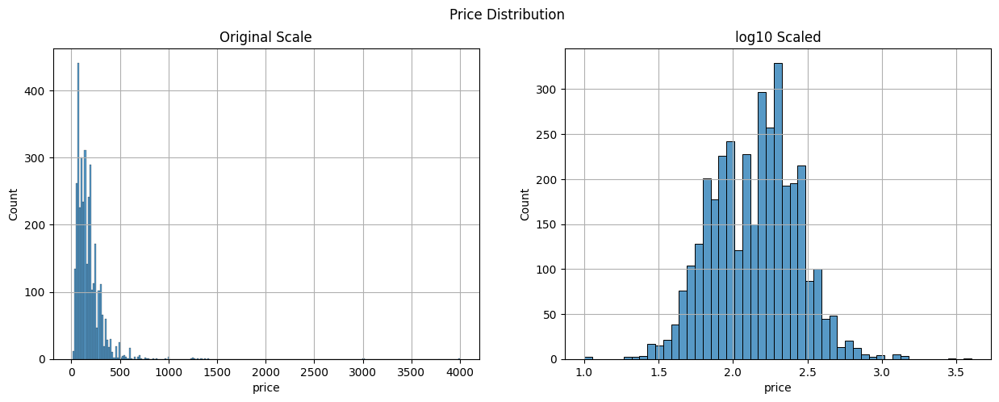

In [248]:
fig, sub = plt.subplots(1,2, figsize = (15,5))

sns.histplot(x = df_listings["price"], edgecolor = "black", ax = sub[0])
sns.histplot(x = np.log10(df_listings["price"]), ax = sub[1])

for name, s in zip(["Original Scale", "log10 Scaled"],sub.flatten()):
    s.grid()

    s.set_title(f"{name}")

fig.suptitle("Price Distribution");

np.mean(df_listings["price"])

### Numerical features

Looking at the Pearson correlation matrix of the numerical features of the dataset, we can see that the target price is correlated in a linear fashion with <br>
several other features (e.g. accommodates, sqaure feet, bath or bedrooms). This could be useful for the further analysis

In [249]:
num_feats = df_listings.dtypes[df_listings.dtypes != "object"].index.tolist()
print(f"There are {len(num_feats)} numerical features")

There are 32 numerical features


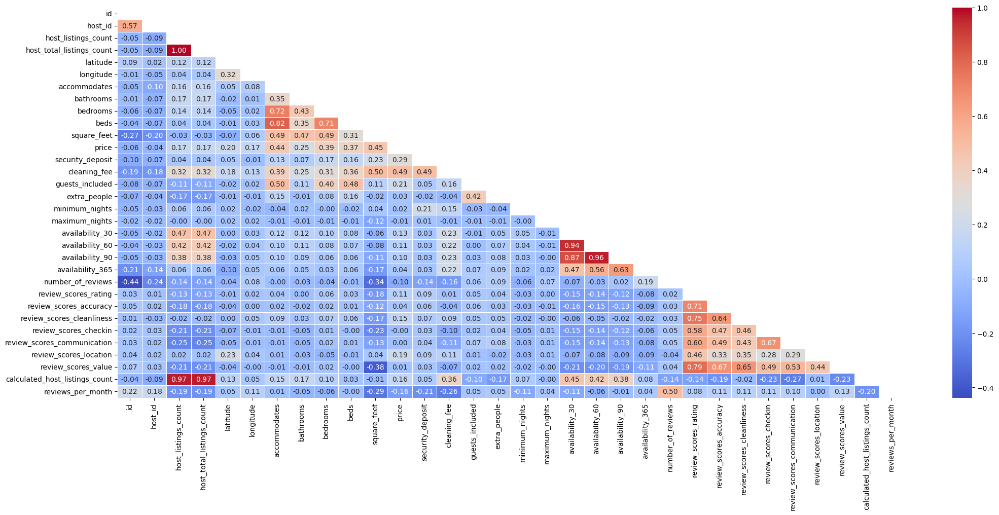

In [250]:
fig, sub = plt.subplots(1,1, figsize = (25,10))

corr_matrix = df_listings[num_feats].corr()
mask = np.zeros_like(corr_matrix)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(corr_matrix, mask = mask, ax = sub, lw = 0.4, cmap = "coolwarm", annot = True, fmt=".2f");

Possible important features could be:
* accommodates
* bathrooms
* bedrooms
* beds
* square feet
* security_deposit
* cleaning_fee
* guests_included
* reviews_per_month

### Categorical featuress

I distinguish the categorical data in low cardinality data (<=10 distinct values) and high cardinality data. <br>
Looking at the low cardinality data, we check the features with a simple groupby-mean() calculation on price to check if the feature could be relevant. 

#### Low Cardinality

In [251]:
cat_feats = [col for col in df_listings.columns if col not in num_feats]

print(f"There are {len(cat_feats)} categorical features")

There are 43 categorical features


In [252]:
not_checked_feats = []

for col in cat_feats:

    if df_listings[col].nunique()<=10:
        print(df_listings.groupby([col])["price"].agg(["mean", "count"]).reset_index(),"\n")
        print("#"*50, "\n")
    else:
        not_checked_feats.append(col)

   host_response_time        mean  count
0  a few days or more  150.627907     43
1        within a day  155.127932    469
2  within a few hours  190.050082   1218
3      within an hour  160.638728   1384 

################################################## 

  host_is_superhost        mean  count
0                 f  173.604468   3178
1                 t  176.434889    407 

################################################## 

  host_has_profile_pic        mean  count
0                    f  171.125000      8
1                    t  173.932066   3577 

################################################## 

  host_identity_verified        mean  count
0                      f  173.428717    982
1                      t  174.113331   2603 

################################################## 

                  market        mean  count
0                 Boston  173.910594   3568
1       Other (Domestic)  182.000000      1
2  Other (International)  350.000000      1
3          San Francisco

#### high cardinality

In [253]:
df_listings[not_checked_feats].head(2)

,name,summary,space,description,neighborhood_overview,notes,transit,access,interaction,house_rules,...,city,zipcode,smart_location,property_type,amenities,weekly_price,monthly_price,calendar_updated,first_review,last_review
0,Sunny Bungalow in the City,"Cozy, sunny, family home. Master bedroom high...",The house has an open and cozy feel at the sam...,"Cozy, sunny, family home. Master bedroom high...","Roslindale is quiet, convenient and friendly. ...",NaN,"The bus stop is 2 blocks away, and frequent. B...","You will have access to 2 bedrooms, a living r...",NaN,Clean up and treat the home the way you'd like...,...,Boston,02131,"Boston, MA",House,"{TV,""Wireless Internet"",Kitchen,""Free Parking ...",NaN,NaN,2 weeks ago,NaN,NaN
1,Charming room in pet friendly apt,Charming and quiet room in a second floor 1910...,Small but cozy and quite room with a full size...,Charming and quiet room in a second floor 1910...,"The room is in Roslindale, a diverse and prima...","If you don't have a US cell phone, you can tex...",Plenty of safe street parking. Bus stops a few...,Apt has one more bedroom (which I use) and lar...,"If I am at home, I am likely working in my hom...",Pet friendly but please confirm with me if the...,...,Boston,02131,"Boston, MA",Apartment,"{TV,Internet,""Wireless Internet"",""Air Conditio...",$400.00,NaN,a week ago,2014-06-01,2016-08-13


In [254]:
df_listings["amenities"]

0       {TV,"Wireless Internet",Kitchen,"Free Parking ...
1       {TV,Internet,"Wireless Internet","Air Conditio...
2       {TV,"Cable TV","Wireless Internet","Air Condit...
3       {TV,Internet,"Wireless Internet","Air Conditio...
4       {Internet,"Wireless Internet","Air Conditionin...
                              ...                        
3580    {Internet,"Wireless Internet","Air Conditionin...
3581    {TV,Internet,"Wireless Internet","Air Conditio...
3582    {"translation missing: en.hosting_amenity_49",...
3583    {Kitchen,Gym,"Family/Kid Friendly",Washer,Drye...
3584    {"Wireless Internet",Kitchen,Essentials,"trans...
Name: amenities, Length: 3585, dtype: object

Possible Features:
* host_response_time
* room_type
* cancellation_policy

The feature "amenities" contains further equipments information of the respective Airbnb. This can be further investigated / processed within the further analysis 

# 4. Analysis

### 1) What are the districts which are the most affordable ones in Boston for a stay?

To answer this question, it is useful to get a first impression concerning the geographical situation in the city.<br>
Therefore, I establish a map showing the location of the different airbnbs colored by their price level (green: really affordable, orange: mid affordable, red: expensive). 

In [255]:
street_prices = df_listings.groupby(["zipcode","street"])["price"].mean().sort_values(ascending=False).reset_index()
zipcode_prices = df_listings.groupby(["zipcode"])["price"].mean().sort_values(ascending=False).reset_index()

nomi = pgeocode.Nominatim("US")
zipcode_prices["latitude"] = nomi.query_postal_code(zipcode_prices["zipcode"].astype("str").tolist())["latitude"]
zipcode_prices["longitude"] = nomi.query_postal_code(zipcode_prices["zipcode"].astype("str").tolist())["longitude"]
zipcode_prices["placename"] = nomi.query_postal_code(zipcode_prices["zipcode"].astype("str").tolist())["place_name"]

In [256]:
def draw_map(df, loc_city_center, zipcode_df):

    fig = Figure(width=1200, height=600)

    min_price = df["price"].astype("float").min()
    median_price = df["price"].astype("float").median()
    std_price = df["price"].astype("float").std()
    max_price = df["price"].astype("float").max()

    map = folium.Map(location=[loc_city_center[0], loc_city_center[1]], zoom_start=12, width=1300, height=600)
    fig.add_child(map)

    folium.TileLayer('cartodbpositron').add_to(map)

    colormap = cm.StepColormap(colors=['green','orange', 'red'] ,
                            index=[min_price, 130, 250,4000], 
                            vmin= min_price,
                            vmax=median_price + 1.5 * std_price)

    for id in df["id"].unique():

        lat = df[df["id"] == id]["latitude"]
        lon = df[df["id"] == id]["longitude"]
        price = df[df["id"] == id]["price"].astype("float").values[0]
        name = df[df["id"] == id]["name"].values[0]

        folium.Circle(
            location = [lat, lon],
            radius=6,
            fill=True,
            popup=f"name: {name}\nprice: {price} Dollar",
            color=colormap(price)
            ).add_to(map)

    #map the different zip-code means 
    for row in zipcode_df.dropna().iterrows():

        mean_price = np.mean(row[1]["price"])
        upper_fence = 250
        middle_fence = 130

        if mean_price>upper_fence:

            folium.Marker(
                location = [row[1]["latitude"], row[1]["longitude"]],
                popup = f"Place {row[1]['placename']}: {np.round(row[1]['price'], 1)}",
                icon=folium.Icon(color="red", icon="home")
            ).add_to(map)
        elif (middle_fence<mean_price)&(mean_price<upper_fence): 

            folium.Marker(
                location = [row[1]["latitude"], row[1]["longitude"]],
                popup = f"Place {row[1]['placename']}: {np.round(row[1]['price'], 1)}",
                icon=folium.Icon(color="orange", icon="home")
            ).add_to(map)
        else:

            folium.Marker(
                location = [row[1]["latitude"], row[1]["longitude"]],
                popup = f"Place {row[1]['placename']}: {np.round(row[1]['price'], 1)}",
                icon=folium.Icon(color='green', icon="home")
            ).add_to(map)
    
    #set marker for city center
    folium.Marker(
        location = [loc_city_center[0], loc_city_center[1]],
        popup = "City Center"
    ).add_to(map)


    display(fig)

#############################

city_center_boston_lat = 42.361145
city_center_boston_lon = -71.057083
boston_loc = (city_center_boston_lat, city_center_boston_lon)

In [257]:
draw_map(df_listings, boston_loc, zipcode_prices)

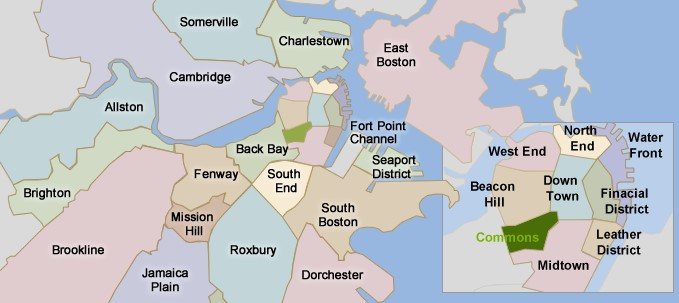

On the map, it can be observed that in the district near to the city center and the coastline (e.g. Financial District, Fort Point Channel, Seaport District, Midtown, West End, etc.), the Airbnbs are with around on average 220 Dollar more expensive.<br>
Districts such as Brighton / Bookline / Allston which are farer away from the city center and the coastline are more affordable (~110 Dollar)
The correlation (correlation-coeff: -0.2962) underlines this suspiscion. 

In [258]:
df_listings["distance_to_city_center"] = df_listings.apply(lambda x: hs.haversine(boston_loc, (x["latitude"], x["longitude"])), axis = 1)

In [259]:
df_listings[["price", "distance_to_city_center"]].corr()

,price,distance_to_city_center
price,1.000000,-0.296221
distance_to_city_center,-0.296221,1.000000


Looking at a ranking of all streets concerning the mean price, we can also confirm our suspiscion looking at Google Maps. Streets which are less far of the city center and the ocean side tend to be more expensive. <br>
On the other side, Airbnbs farer away from the city center and the ocean side tend to be lower in price.

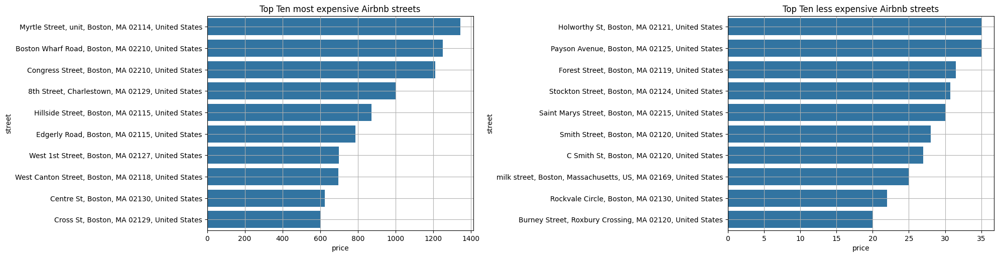

In [260]:
fig, sub = plt.subplots(1,2, figsize=(20,5))

sns.barplot(y = street_prices["street"].head(10), x = street_prices["price"].head(10), ax = sub[0], orient = "h")
sns.barplot(y = street_prices["street"].tail(10), x = street_prices["price"].tail(10), ax = sub[1], orient = "h")

fig.tight_layout()

for s, name in zip(sub.flatten(), ["Top Ten most expensive Airbnb streets", "Top Ten less expensive Airbnb streets"]):
    s.grid()
    s.set_title(f"{name}")

Conclusion: Beside the finding (or the confirmation of a initial intuition) that in Boston the Airbnbs farer away from the city center and the coastline, there are several district which could be interesting.<br>
* Brighton 
* East Boston
* Roxbury

### 2) Which equipments or amenities are most popular? 

In the closer look on the features within the EDA section (Point 3. More extensive EDA), it was stated that the feature 'amenities' contains some equipments of the respective airbnb such as "AirConditioning", "Cable TV" or "Dryer". 
To answer the question above, we will simply extract the data in the respective column and split it in multiple, independent binary columns:  

In [261]:
amenities_dict = {}

for id in df_listings["id"]: 

    amenities = df_listings[df_listings["id"] == id]["amenities"].replace(r"[{}\"]", "", regex = True).str.split(",").iloc[0]
    amenities_dict[id] = amenities

list_amenities = sorted(list(set(",".join([",".join(l) for l in list(amenities_dict.values())]).split(","))))[1:]
df_amenities = pd.DataFrame({"Amenities": list_amenities})

for listing_id in list(amenities_dict.keys()):

    df_amenities[listing_id] = [1 if amenit in amenities_dict[listing_id] else 0 for amenit in df_amenities["Amenities"]]

df_amenities = df_amenities.set_index("Amenities").T

In [262]:
df_amenities

Amenities,24-Hour Check-in,Air Conditioning,Breakfast,Buzzer/Wireless Intercom,Cable TV,Carbon Monoxide Detector,Cat(s),Dog(s),Doorman,Dryer,...,Smoke Detector,Smoking Allowed,Suitable for Events,TV,Washer,Washer / Dryer,Wheelchair Accessible,Wireless Internet,translation missing: en.hosting_amenity_49,translation missing: en.hosting_amenity_50
12147973,0,0,0,0,0,0,0,1,0,1,...,1,0,0,1,1,0,0,1,0,0
3075044,0,1,0,0,0,1,0,1,0,1,...,1,0,0,1,1,0,0,1,0,0
6976,0,1,0,0,1,1,0,0,0,1,...,1,0,0,1,1,0,0,1,1,1
1436513,0,1,1,0,0,1,0,0,0,1,...,1,0,0,1,1,0,0,1,0,0
7651065,0,1,1,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8373729,1,1,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
14844274,1,1,0,0,0,1,0,0,0,1,...,1,1,0,1,1,0,0,1,0,0
14585486,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
14603878,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,1


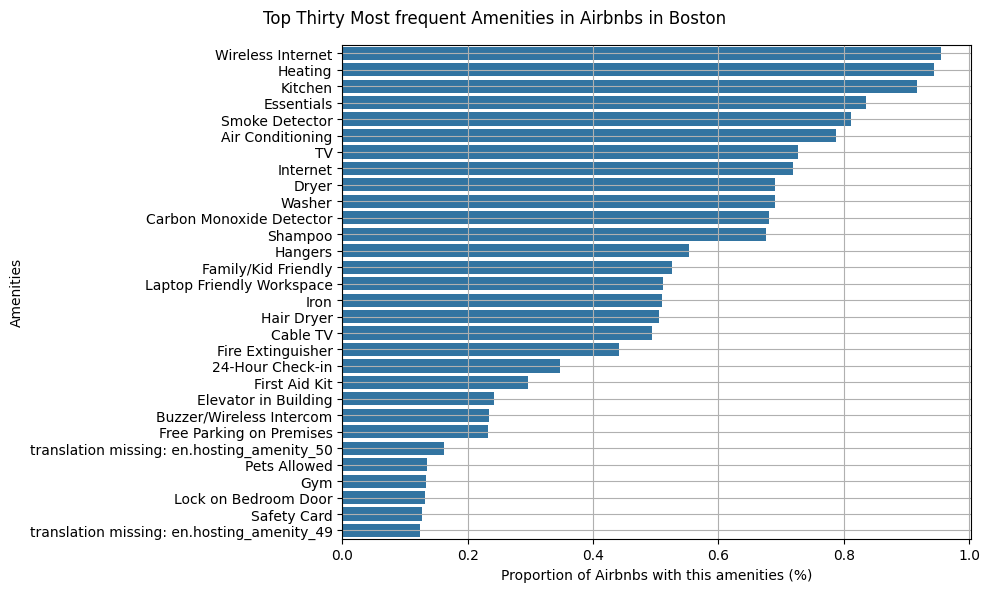

In [263]:
fig,sub = plt.subplots(1,1,figsize=(10,6))

top_thirty_amenities = df_amenities.mean(axis=0).sort_values(ascending = False).head(30)

sns.barplot(
    y = top_thirty_amenities.index,
    x = top_thirty_amenities,
    ax = sub,
    orient = "h"
)

sub.grid()
sub.set_xlabel("Proportion of Airbnbs with this amenities (%)")
fig.suptitle("Top Thirty Most frequent Amenities in Airbnbs in Boston")

fig.tight_layout()

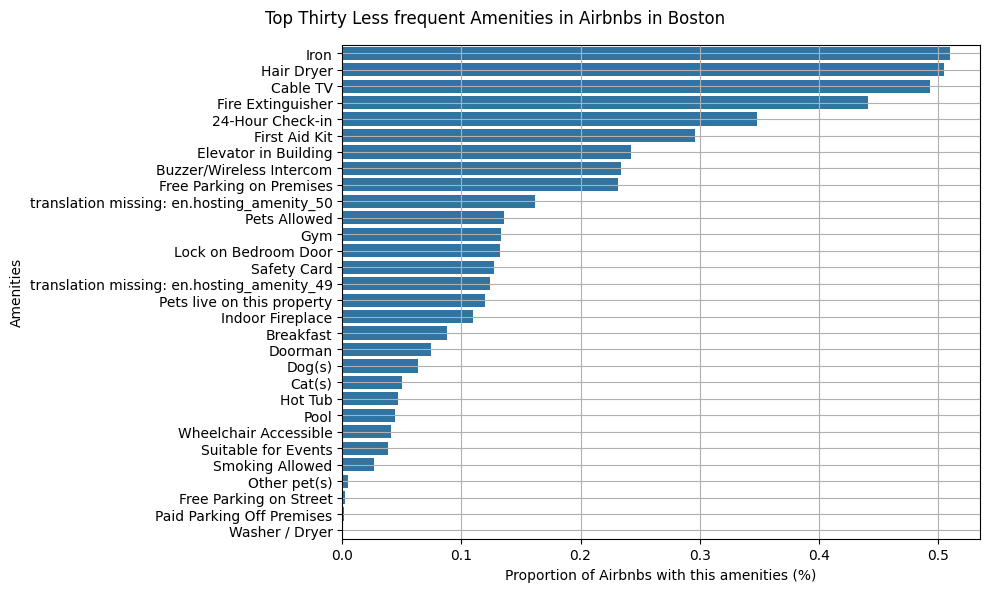

In [264]:
fig,sub = plt.subplots(1,1,figsize=(10,6))

tail_thirty_amenities = df_amenities.mean(axis=0).sort_values(ascending = False).tail(30)

sns.barplot(
    y = tail_thirty_amenities.index,
    x = tail_thirty_amenities,
    ax = sub,
    orient = "h"
)

sub.grid()
sub.set_xlabel("Proportion of Airbnbs with this amenities (%)")
fig.suptitle("Top Thirty Less frequent Amenities in Airbnbs in Boston")

fig.tight_layout()

We can see: 
* that most of the Airbnbs have "wireless internet" (~94%), a "heating" (~90%) / "kitchen" (~90%) and additional features such as a "TV" (~75%), "Iron" or "washer".
* There are less Airbnbs where "smoking is allowed" and which have a "breakfast" included in the stay or a gym.

But this descriptive analysis above just tell us which amenities are in most of the Airbnbs. We want to know the which amenities are in general more popular for the customers of Airbnb.<br>
The attribute "availability_30" is described as "The availability of the listing 30 days in the future as determined by the calendar. Note a listing may not be available because it has been booked by a guest or blocked by the host."

So, we will look at the Airbnbs which are most popular or in other word the less available in the next 30 days (availability_30) assuming that just a low % of hosts are deliberately blocking their airbnb and check the top 10 amenities of these Airbnbs.



In [265]:
df_listings_relevant = pd.merge(
    left = df_listings,
    right = df_amenities,
    left_on= "id",
    right_index=True,
    how = "left"
)

df_listings_relevant.drop("id", axis = 1, inplace = True)
df_listings_available_30 = df_listings_relevant[df_listings_relevant["availability_30"]<=30*0.2][df_amenities.columns]

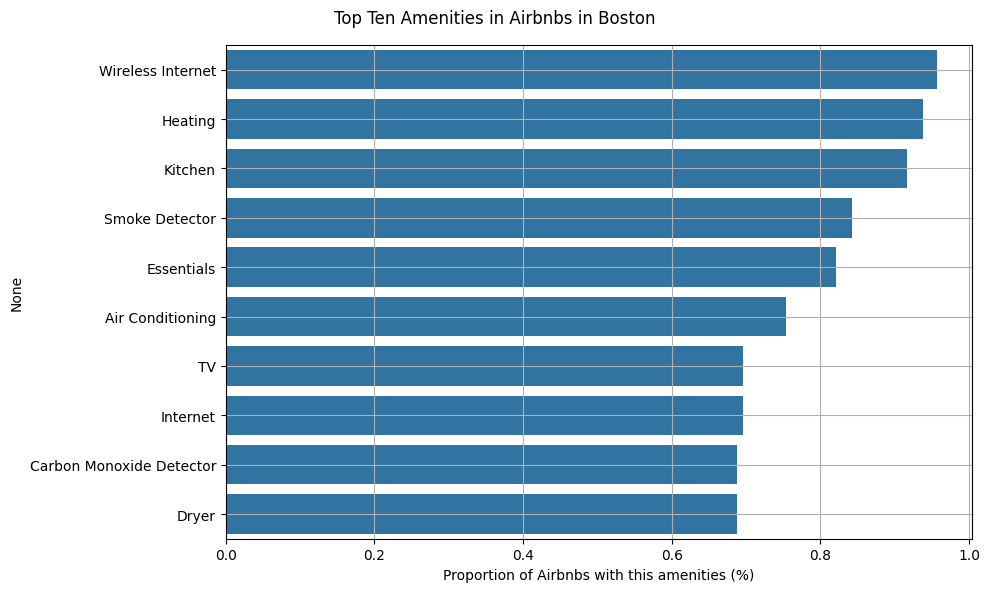

In [266]:
fig,sub = plt.subplots(1,1,figsize=(10,6))
top_ten_amenities_available_30= df_listings_available_30.mean(axis=0).sort_values(ascending = False).head(10)

sns.barplot(
    y = top_ten_amenities_available_30.index,
    x = top_ten_amenities_available_30,
    ax = sub,
    orient = "h"
)

sub.grid()
sub.set_xlabel("Proportion of Airbnbs with this amenities (%)")
fig.suptitle("Top Ten Amenities in Airbnbs in Boston")

fig.tight_layout()

The most popular Airbnbs, which are mostly booked in the next 30 days, show the top ten amenities above. <br>
Given that these listings seem to be quite popular, we deduct that also these amenities are quite popular for the choice of a Airbnb.  

### c) Which factors have an influence on the price and how big is this influence? 

#### First general processing steps

In [267]:
cat_var = df_listings_relevant.dtypes[df_listings_relevant.dtypes == "object"].index.tolist()
num_var = df_listings_relevant.dtypes[df_listings_relevant.dtypes != "object"].index.tolist()

##### Analysis of categorical features

In [268]:
for col in cat_var:
    print(f"{col}: {df_listings_relevant[col].iloc[0]}")

name: Sunny Bungalow in the City
summary: Cozy, sunny, family home.  Master bedroom high ceilings. Deck, garden with hens, beehives & play structure.   Short walk to charming village with  attractive stores, groceries & local restaurants. Friendly neighborhood. Access public transportation.
space: The house has an open and cozy feel at the same time.  The living room has a flat screen TV.  The kitchen has all you need for cooking.  We prefer you buy your food but can use the organic oils, herbs, etc.   The yard can be seen from sitting room and when the weather allows, the yard is a place children can lose themselves in a safe way.  We have 2 bee hives, 6 hens fenced in (sometimes they get out of their coop area & into the yard), 2 rabbits in a hutch and play structure.
description: Cozy, sunny, family home.  Master bedroom high ceilings. Deck, garden with hens, beehives & play structure.   Short walk to charming village with  attractive stores, groceries & local restaurants. Friendly 

To keep things for the moment simple, beside the amenity column, from which we extracted already the equipments of the airbnbs, we consider the attribute 'room_type' and 'property_type'

In [269]:
relevant_cat_feats = ["property_type", "room_type"]

##### Analysis of numerical features

In [270]:
for feat in num_var:

    print(f"Feature: {feat}")
    print(f"nunique vals: {df_listings_relevant[feat].nunique()}")
    print(f"Null vals: {df_listings_relevant[feat].isnull().sum()/df_listings_relevant.shape[0]}\n")

Feature: host_id
nunique vals: 2181
Null vals: 0.0

Feature: host_listings_count
nunique vals: 35
Null vals: 0.0

Feature: host_total_listings_count
nunique vals: 35
Null vals: 0.0

Feature: latitude
nunique vals: 3585
Null vals: 0.0

Feature: longitude
nunique vals: 3585
Null vals: 0.0

Feature: accommodates
nunique vals: 14
Null vals: 0.0

Feature: bathrooms
nunique vals: 12
Null vals: 0.003905160390516039

Feature: bedrooms
nunique vals: 6
Null vals: 0.002789400278940028

Feature: beds
nunique vals: 11
Null vals: 0.002510460251046025

Feature: square_feet
nunique vals: 37
Null vals: 0.9843793584379359

Feature: price
nunique vals: 324
Null vals: 0.0

Feature: security_deposit
nunique vals: 54
Null vals: 0.6256624825662482

Feature: cleaning_fee
nunique vals: 79
Null vals: 0.3087866108786611

Feature: guests_included
nunique vals: 13
Null vals: 0.0

Feature: extra_people
nunique vals: 51
Null vals: 0.0

Feature: minimum_nights
nunique vals: 29
Null vals: 0.0

Feature: maximum_nights


In [271]:
to_drop = ["host_id", "square_feet", "security_deposit", "cleaning_fee"]
df_listings_relevant.drop(to_drop, axis = 1, inplace = True)

#### Split the data in train (train/test) and validation set

In [272]:
validation_set = df_listings_relevant.sample(int(0.1 * df_listings_relevant.shape[0]))
train_set = df_listings_relevant.drop(validation_set.index)

#x_tr, x_t, y_tr, y_t = train_test_split(train_set.drop("price", axis = 1), train_set["price"], test_size=0.1)

#### Define preprocessing functions

In [273]:
def reduce_property_cardinality(df_train, df_test = None):
    
    freq_prop_types = df_train["property_type"].value_counts().head(6).index.values

    df_train.loc[~df_train["property_type"].isin(freq_prop_types), "property_type"] = "Other"

    if df_test is not None:
        df_test.loc[~df_test["property_type"].isin(freq_prop_types), "property_type"] = "Other"
        return df_train, df_test
    
    return df_train

In [274]:
def determine_relevant_num_features(df, no_of_feat):

    num_vars = df.dtypes[df.dtypes != "object"].index.tolist()
    relevant_num_feat = pd.concat([df[num_vars].drop("price", axis = 1), df["price"]], axis = 1).corr()["price"].abs().sort_values(ascending = False).iloc[1:no_of_feat+1].index.tolist()
    return relevant_num_feat

In [275]:
def impute_data(df_train, df_test = None):

    types = df_train.dtypes

    for feat in df_train.columns:

        if types[feat] == "object":
            df_train[feat] = df_train[feat].fillna(df_train[feat].mode()[0])
            
            if df_test is not None:
                df_test[feat] = df_test[feat].fillna(df_train[feat].mode()[0])

        else:
            df_train[feat] = df_train[feat].fillna(df_train[feat].median())
            if df_test is not None:
                df_test[feat] = df_test[feat].fillna(df_train[feat].median())
    
    return df_train, df_test

In [276]:
def preprocess(X_train, y_train, X_test, y_test):

    #reduce cardinality

    print("property_type" in X_train.columns.tolist())

    X_train, X_test = reduce_property_cardinality(X_train, X_test)

    #determine relevant features
    relevant_num_feats = determine_relevant_num_features(pd.concat([X_train, y_train], axis = 1), 30)
    relevant_feats = relevant_cat_feats + relevant_num_feats

    X_train, X_test = X_train[relevant_feats], X_test[relevant_feats]

    #impute missing data
    X_train, X_test = impute_data(X_train, X_test)

    #Get Dummies
    cat_train = pd.get_dummies(X_train[relevant_cat_feats], prefix_sep = "_")
    cat_train["origin"] = "train"

    cat_test = pd.get_dummies(X_test[relevant_cat_feats], prefix_sep = "_")
    cat_test["origin"] = "test"

    cat_summary = pd.concat([cat_train, cat_test], axis = 0)

    X_train.drop(relevant_cat_feats, axis = 1, inplace = True)
    cat_summary_filtered_train = cat_summary[cat_summary["origin"] == "train"].drop("origin", axis = 1)

    X_test.drop(relevant_cat_feats, axis = 1, inplace = True)
    cat_summary_filtered_test = cat_summary[cat_summary["origin"] == "test"].drop("origin", axis = 1)

    X_train = pd.concat([X_train, cat_summary_filtered_train], axis = 1)
    X_test = pd.concat([X_test, cat_summary_filtered_test], axis = 1)

    return X_train, X_test, y_train, y_test

In [277]:
X = train_set.drop("price", axis = 1)
y = train_set["price"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)

In [279]:
X_train_prep, X_test_prep, y_train_prep, y_test_prep = preprocess(X_train, X_test, y_train, y_test)

True
True


AttributeError: 'Series' object has no attribute 'columns'

In [52]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#y_train_trans = np.log10(y_train)
#y_test_trans = np.log10(y_test)

In [93]:
params = {"alpha": 0.01, "random_state":42, "fit_intercept":True}
model = Ridge(**params)

model.fit(X_train_scaled, y_train)

Ridge(alpha=0.01, random_state=42)

In [70]:
y_test_pred = model.predict(X_test_scaled)

In [71]:
root_mean_squared_error(y_test, y_test_pred)

np.float64(92.8360194646074)

In [75]:
coefficient_df = pd.DataFrame({"Feats": X_train.columns, "coefs": np.round(model.coef_ * scaler.scale_,2)})
coefficient_df.sort_values(by = "coefs", ascending=False, inplace = True)

(-15.0, 15.0)

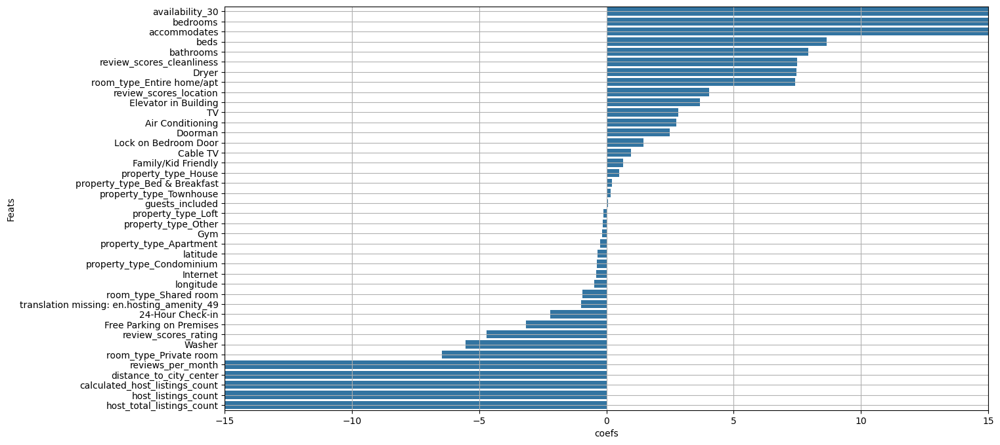

In [91]:
fig,sub = plt.subplots(1,1, figsize = (15,8))

sns.barplot(y = coefficient_df["Feats"], x = coefficient_df["coefs"], orient = "h", ax = sub)
sub.grid()
sub.set_xlim([-15, 15])

In [92]:
coefficient_df

,Feats,coefs
27,availability_30,131.30
1,bedrooms,23.06
0,accommodates,18.97
2,beds,8.67
4,bathrooms,7.94
20,review_scores_cleanliness,7.49
21,Dryer,7.47
37,room_type_Entire home/apt,7.42
12,review_scores_location,4.03
8,Elevator in Building,3.67


#### Crossvalidation

In [1731]:
def crossvalidate_model(X_, y_, model, k_fold):

    kfold = KFold(n_splits=k_fold, shuffle=True, random_state=42) 

    test_score_r2 = []
    test_score_rmse = []
    test_score_mae = []

    for k, (train_index,test_index) in enumerate(kfold.split(X_)):
        
        X_train, X_test, y_train, y_test = X_.iloc[train_index], X_.iloc[test_index], y_.iloc[train_index], y_.iloc[test_index]

        #1) determine relevant feats
        relevant_num_feats = determine_relevant_num_features(pd.concat([X_train, y_train],axis = 1), 30)
        relevant_feats = relevant_cat_feats + relevant_num_feats

        #2) choose only relevant feats
        X_train[relevant_feats], X_test[relevant_feats]

        #3) reduce cardinality
        X_train, X_test = reduce_property_cardinality(X_train, X_test)
        
        #4) impute data
        X_train, X_test = impute_data(X_train, X_test)

        #5) get dummies
        pd.get_dummies(X_train[relevant_cat_feats], )


        #5) scale predictors
        #6) fit model
        #7) calc scores
        #8) print current scores







        cols_to_impute = get_data_to_impute(X_).index

        for col in cols_to_impute:

            X_train[col], X_test[col] = impute_vals(X_train[col], X_test[col])

        #Scaling        
        y_train_log = np.log10(y_train)

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        #Model
        model.fit(X_train_scaled, y_train_log)

        y_test_preds = model.predict(X_test_scaled)
        y_test_preds = 10**y_test_preds

        test_score_r2_ = r2_score(y_test, y_test_preds)
        test_score_rmse_ = root_mean_squared_error(y_test, y_test_preds)
        test_score_mae_ = mean_absolute_error(y_test, y_test_preds)

        #print scores
        print(f"\n############ Fold {k+1} ############")
        for score_name, score in zip(["r2 Score", "rmse", "mae"], [test_score_r2_, test_score_rmse_, test_score_mae_]):
            print(f"{score_name}: {score}")

        test_score_r2.append(np.round(test_score_r2_,2))
        test_score_rmse.append(np.round(test_score_rmse_,2))
        test_score_mae.append(np.round(test_score_mae_,2))

    return [test_score_r2, test_score_rmse, test_score_mae]

In [ ]:
df_listings_relevant = df_listings_relevant[relevant_feats]

#### Check cardinality

In [1675]:
#reduce cardinality of property type
freq_prop_types = df_listings_relevant["property_type"].value_counts().head(6).index.values
df_listings_relevant.loc[~df_listings_relevant["property_type"].isin(freq_prop_types), "property_type"] = "Other"

#### Check which columns have missing data

In [1676]:
relevant_feats = ["accommodates", "bedrooms","bathrooms","beds", "security_deposit", "cleaning_fee", "guests_included",
                  "reviews_per_month", "host_response_time", "room_type", "cancellation_policy", "distance_to_city_center", "price", "property_type"]

amenity_ls = df_amenities.columns.tolist()

relevant_feats.extend(amenity_ls)

In [1677]:
col_with_null = df_listings_relevant[relevant_feats].isnull().sum()[df_listings_relevant[relevant_feats].isnull().sum()!=0]
col_with_null

bedrooms                10
bathrooms               14
beds                     9
square_feet           3529
security_deposit      2243
cleaning_fee          1107
reviews_per_month      756
host_response_time     471
dtype: int64

In [1678]:
col_dtypes = df_listings_relevant[col_with_null.index.tolist()].dtypes
col_dtypes

bedrooms              float64
bathrooms             float64
beds                  float64
square_feet           float64
security_deposit      float64
cleaning_fee          float64
reviews_per_month     float64
host_response_time     object
dtype: object

Decisions:
* We will drop the feature square_feet due to the high missing data. 
* for security_deposit / cleaning_fee we'll assume that missing data means, that there is no deposit / fee and we'll impute them with 0
* for the other features we'll impute with the median / mode

#### tdsfdd

In [1625]:
df_listings_relevant = df_listings_relevant[relevant_feats]
df_listings_relevant.drop("square_feet", axis = 1, inplace=True)

In [1626]:
df_listings_relevant["security_deposit"].fillna(0, inplace = True)
df_listings_relevant["cleaning_fee"].fillna(0, inplace = True)

In [1627]:
X, y = df_listings_relevant.drop("price", axis = 1), df_listings_relevant["price"] 

In [1628]:
types = X.dtypes

for feat in X.columns:

    if types[feat] == "object":
        X[feat] = X[feat].fillna(X[feat].mode()[0])
    else:
        X[feat] = X[feat].fillna(X[feat].median())

In [1629]:
X_cat = pd.get_dummies(X[X.dtypes[X.dtypes=="object"].index.tolist()], prefix_sep="_")
X_num = X[X.dtypes[X.dtypes!="object"].index.tolist()]

X_final = pd.concat([X_num, X_cat], axis = 1)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_final)

y_trans = np.log10(y)

In [1630]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.1, shuffle= True)

In [1631]:
params = {"alpha": 0.001, "random_state":42, "fit_intercept":True}
model = Ridge(**params)

In [1632]:
model.fit(X_train, y_train)

Ridge(alpha=0.001, random_state=42)

In [1633]:
y_test_pred = model.predict(X_test)
#y_test_pred = 10 ** y_test_pred
#y_test = 10 ** y_test

In [1634]:
root_mean_squared_error(y_true = y_test, y_pred=y_test_pred)

np.float64(81.44665951952115)

In [1637]:
pd.DataFrame({"Feats": X_final.columns, "coefs": np.round(model.coef_ * scaler.scale_,2)})

,Feats,coefs
0,accommodates,19.88
1,bedrooms,18.81
2,bathrooms,7.44
3,beds,7.80
4,security_deposit,2414.78
5,cleaning_fee,-266.12
6,guests_included,4.88
7,reviews_per_month,-23.91
8,distance_to_city_center,-70.37
9,24-Hour Check-in,-0.93


In [ ]:
def crossvalidate_model(X_, y_, model, k_fold):

    kfold = KFold(n_splits=k_fold, shuffle=True, random_state=42) 

    test_score_r2 = []
    test_score_rmse = []
    test_score_mae = []

    for k, (train_index,test_index) in enumerate(kfold.split(X_)):
        
        X_train, X_test, y_train, y_test = X_.iloc[train_index], X_.iloc[test_index], y_.iloc[train_index], y_.iloc[test_index]


        cols_to_impute = get_data_to_impute(X_).index

        for col in cols_to_impute:

            X_train[col], X_test[col] = impute_vals(X_train[col], X_test[col])

        #Scaling        
        y_train_log = np.log10(y_train)

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        #Model
        model.fit(X_train_scaled, y_train_log)

        y_test_preds = model.predict(X_test_scaled)
        y_test_preds = 10**y_test_preds

        test_score_r2_ = r2_score(y_test, y_test_preds)
        test_score_rmse_ = root_mean_squared_error(y_test, y_test_preds)
        test_score_mae_ = mean_absolute_error(y_test, y_test_preds)

        #print scores
        print(f"\n############ Fold {k+1} ############")
        for score_name, score in zip(["r2 Score", "rmse", "mae"], [test_score_r2_, test_score_rmse_, test_score_mae_]):
            print(f"{score_name}: {score}")

        test_score_r2.append(np.round(test_score_r2_,2))
        test_score_rmse.append(np.round(test_score_rmse_,2))
        test_score_mae.append(np.round(test_score_mae_,2))

    return [test_score_r2, test_score_rmse, test_score_mae]

In [4483]:
df_listing_validation = df_listings_relevant.sample(int(df_listings_relevant.shape[0] * 0.1))
df_listing_train = df_listings_relevant.drop(index= df_listing_validation.index.tolist())

In [4484]:
set(df_listing_train.columns) == set(df_listing_validation.columns)

True

### Define the relevant features

Numerical feats

In [4485]:
ls_attribute = []
ls_corr = []

for col in df_listing_train.columns[df_listings_relevant.dtypes != "object"]:
    ls_attribute.append(col)

    df_tmp = df_listing_train[["price", col]].dropna()

    ls_corr.append(np.corrcoef(df_tmp["price"], df_tmp[col])[0,1])

correlation_num = pd.DataFrame({"Target": ["Price"] * len(ls_attribute), "Attribute": ls_attribute, "corr": ls_corr, "corr_abs": np.abs(ls_corr)}).sort_values(by = "corr_abs", ascending= False)

In [4486]:
correlation_num.head(20)

,Target,Attribute,corr,corr_abs
8,Price,cleaning_fee,0.495245,0.495245
3,Price,accommodates,0.429969,0.429969
5,Price,bedrooms,0.376346,0.376346
6,Price,beds,0.360992,0.360992
25,Price,distance_to_city_center,-0.290762,0.290762
26,Price,security_deposit,0.289634,0.289634
4,Price,bathrooms,0.247093,0.247093
67,Price,TV,0.243577,0.243577
41,Price,Family/Kid Friendly,0.228101,0.228101
33,Price,Cable TV,0.221165,0.221165


In [4487]:
relevant_feats_num = list(correlation_num.head(20)["Attribute"].values)
relevant_feats_num.append("price")

Categorical feats

In [4488]:
for col in df_listing_train.columns[df_listing_train.dtypes == "object"]:

    df_tmp = df_listing_train.groupby(col)["price"].mean()
    print(df_tmp, "\n")

host_response_time
a few days or more    151.300000
within a day          155.281324
within a few hours    190.000000
within an hour        159.765127
Name: price, dtype: float64 

host_is_superhost
f    173.557228
t    174.362162
Name: price, dtype: float64 

host_has_profile_pic
f    171.125000
t    173.655794
Name: price, dtype: float64 

host_identity_verified
f    174.868331
t    173.191816
Name: price, dtype: float64 

room_type
Entire home/apt    226.947176
Private room        96.188103
Shared room         95.577465
Name: price, dtype: float64 

bed_type
Airbed            81.081081
Couch             94.000000
Futon             81.869565
Pull-out Sofa    100.370370
Real Bed         176.977156
Name: price, dtype: float64 

instant_bookable
f    177.431387
t    154.747212
Name: price, dtype: float64 

cancellation_policy
flexible           149.385218
moderate           159.107100
strict             189.348772
super_strict_30    319.564103
Name: price, dtype: float64 

require_guest

In [4489]:
relevant_feats_cat = ["host_response_time", "room_type", "bed_type", "instant_bookable", "cancellation_policy",
                      "require_guest_profile_picture", "require_guest_phone_verification"]

In [4490]:
relevant_feats = list(relevant_feats_num) + relevant_feats_cat

In [4491]:
df_listing_train = df_listing_train[relevant_feats]
df_listing_validation = df_listing_validation[relevant_feats]


In [4492]:
set(df_listing_train.columns) == set(df_listing_validation.columns)

True

### Define transformation function

#### a) General transformations

In [4493]:
def get_data_to_impute(df_):

    return df_.isnull().sum()[(df_.isnull().sum()>0)].sort_values(ascending = False) / df_.shape[0]

In [4494]:
get_data_to_impute(df_listing_train)

security_deposit          0.628447
cleaning_fee              0.308646
review_scores_location    0.229315
reviews_per_month         0.210412
host_response_time        0.127363
bathrooms                 0.003409
bedrooms                  0.003099
beds                      0.002169
dtype: float64

In [4495]:
get_data_to_impute(df_listing_validation)

security_deposit          0.600559
cleaning_fee              0.310056
review_scores_location    0.229050
reviews_per_month         0.215084
host_response_time        0.167598
bathrooms                 0.008380
beds                      0.005587
dtype: float64

In [4496]:
df_listing_train["security_deposit"].fillna(0, inplace = True)
df_listing_train["cleaning_fee"].fillna(0, inplace = True)

df_listing_validation["security_deposit"].fillna(0, inplace = True)
df_listing_validation["cleaning_fee"].fillna(0, inplace = True)

In [4497]:
get_data_to_impute(df_listing_train)

review_scores_location    0.229315
reviews_per_month         0.210412
host_response_time        0.127363
bathrooms                 0.003409
bedrooms                  0.003099
beds                      0.002169
dtype: float64

In [4498]:
get_data_to_impute(df_listing_validation)

review_scores_location    0.229050
reviews_per_month         0.215084
host_response_time        0.167598
bathrooms                 0.008380
beds                      0.005587
dtype: float64

### Prepare data for prediction

#### Check for outliers

In [4499]:
def tuckey_method(df_):

    Q1 = df_.quantile(0.25)
    Q3 = df_.quantile(0.75)
    IQR = Q3 - Q1
    outliers_iqr = df_[(df_ < (Q1 - 1.5 * IQR)) | (df_> (Q3 + 1.5 * IQR))]
                      
    return outliers_iqr

tuckey_method(df_listing_train["price"]).sort_values(ascending=False).shape

(96,)

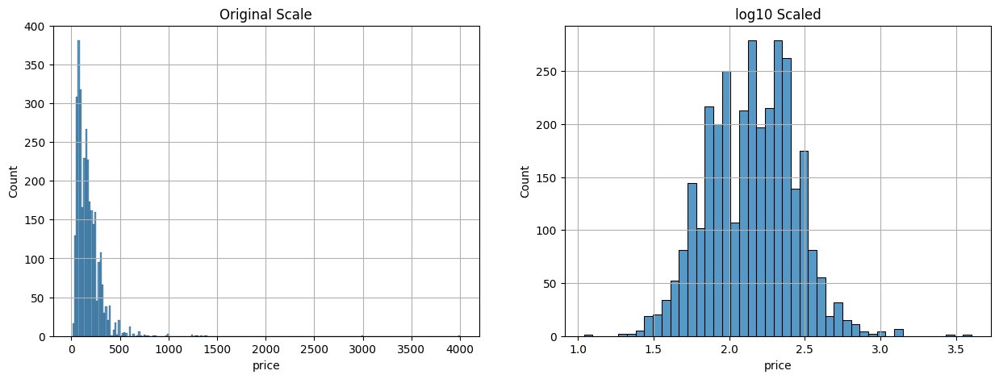

In [4500]:
fig, sub = plt.subplots(1,2, figsize = (15,5))

sns.histplot(x = df_listing_train["price"], ax = sub[0])
sns.histplot(x = np.log10(df_listing_train["price"]), ax = sub[1])

for name, s in zip(["Original Scale", "log10 Scaled"],sub.flatten()):
    s.grid()

    s.set_title(f"{name}")

### Split Predictor and dependent variable

In [4501]:
X_ = df_listing_train.drop("price", axis = 1)
y_ = df_listing_train["price"]

X_valid = df_listing_validation.drop("price", axis = 1)
y_valid = df_listing_validation["price"]

### Treat for categorical values

In [4502]:
cols_binary = ['instant_bookable',
 'require_guest_phone_verification',
 'require_guest_profile_picture']

In [4503]:
for col in cols_binary:
    X_[col] = X_[col].map({"f": 0, "t": 1})
    X_valid[col] = X_valid[col].map({"f": 0, "t": 1}) 

In [4504]:
X_num = X_[X_.columns[X_.dtypes != "object"].tolist()]
X_cat = X_[X_.columns[X_.dtypes == "object"].tolist()]

X_num_valid = X_valid[X_valid.columns[X_valid.dtypes != "object"].tolist()]
X_cat_valid = X_valid[X_valid.columns[X_valid.dtypes == "object"].tolist()]

host reponse time

In [4505]:
df_listing_train.groupby("host_response_time")["price"].agg(["mean", "count"])

,mean,count
host_response_time,,
a few days or more,151.300000,40
within a day,155.281324,423
within a few hours,190.000000,1097
within an hour,159.765127,1256


In [4506]:
host_response_map = {
    "a few days or more" : "a_day_or_more",
    "within a day": "a_day_or_more",
    "within a few hours": "within a few hours",
    "within an hour": "within an hour"
}

room_type

In [4507]:
df_listing_train.groupby("room_type")["price"].agg(["mean", "count"])

,mean,count
room_type,,
Entire home/apt,226.947176,1912
Private room,96.188103,1244
Shared room,95.577465,71


In [4508]:
room_type = {
    "Entire home/apt":"Entire home/apt",
    "Private room": "room",
    "Shared room": "room" 
}

Bed_type

In [4509]:
df_listing_train.groupby("bed_type")["price"].agg(["mean", "count"])

,mean,count
bed_type,,
Airbed,81.081081,37
Couch,94.000000,9
Futon,81.869565,46
Pull-out Sofa,100.370370,27
Real Bed,176.977156,3108


In [4510]:
bed_type_map = {"Real Bed": "Real Bed"}

Cancellation_policy

In [4511]:
df_listing_train.groupby("cancellation_policy")["price"].agg(["mean", "count"])

,mean,count
cancellation_policy,,
flexible,149.385218,893
moderate,159.107100,831
strict,189.348772,1425
super_strict_30,319.564103,78


In [4512]:
cancellation_policy_map = {"flexible": "flexible", "moderate": "moderate", "strict": "strict", "super_strict_30": "strict"}

Impute

In [4513]:
def impute_vals(df_train, df_test):


    if df_train is None: 
        if df_test.dtypes == "object":
            df_test.fillna(df_test.mode()[0],inplace = True)
        else:
            df_test.fillna(df_test.mean(), inplace = True)
    else:
        if df_train.dtypes == "object":
            df_train.fillna(df_train.mode()[0], inplace = True)
            df_test.fillna(df_train.mode()[0], inplace = True)
        else:
            df_train.fillna(df_train.median(), inplace = True)
            df_test.fillna(df_train.median(), inplace = True)

    return df_train, df_test

In [4514]:
X_cat["host_response_time"] = X_cat["host_response_time"].fillna(X_cat["host_response_time"].mode()[0]).map(host_response_map)
X_cat["room_type"] = X_cat["room_type"].fillna(X_cat["room_type"].mode()[0]).map(room_type)
X_cat["bed_type"] = X_cat["bed_type"].fillna(X_cat["bed_type"].mode()[0]).map(bed_type_map)
X_cat["cancellation_policy"] = X_cat["cancellation_policy"].fillna(X_cat["cancellation_policy"].mode()[0]).map(cancellation_policy_map)

In [4515]:
X_cat_valid["host_response_time"] = X_cat_valid["host_response_time"].fillna(X_cat_valid["host_response_time"].mode()[0]).map(host_response_map)
X_cat_valid["room_type"] = X_cat_valid["room_type"].fillna(X_cat_valid["room_type"].mode()[0]).map(room_type)
X_cat_valid["bed_type"] = X_cat_valid["bed_type"].fillna(X_cat_valid["bed_type"].mode()[0]).map(bed_type_map)
X_cat_valid["cancellation_policy"] = X_cat_valid["cancellation_policy"].fillna(X_cat_valid["cancellation_policy"].mode()[0]).map(cancellation_policy_map)

In [4516]:
X_cat_valid.isnull().sum()

host_response_time      0
room_type               0
bed_type               13
cancellation_policy     0
dtype: int64

In [4517]:
X_cat_valid["bed_type"].fillna(X_cat_valid["bed_type"].mode()[0], inplace = True)

In [4518]:
X_ = pd.concat([X_num, pd.get_dummies(data = X_cat, prefix_sep = "_", drop_first=True)], axis = 1)
X_valid = pd.concat([X_num_valid, pd.get_dummies(data = X_cat_valid, prefix_sep = "_", drop_first=True)], axis = 1)

### Ridge Regression

#### Crossvalidation Approach

In [4519]:
def crossvalidate_model(X_, y_, model, k_fold):

    kfold = KFold(n_splits=k_fold, shuffle=True, random_state=42) 

    test_score_r2 = []
    test_score_rmse = []
    test_score_mae = []

    for k, (train_index,test_index) in enumerate(kfold.split(X_)):
        
        X_train, X_test, y_train, y_test = X_.iloc[train_index], X_.iloc[test_index], y_.iloc[train_index], y_.iloc[test_index]


        cols_to_impute = get_data_to_impute(X_).index

        for col in cols_to_impute:

            X_train[col], X_test[col] = impute_vals(X_train[col], X_test[col])

        #Scaling        
        y_train_log = np.log10(y_train)

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        #Model
        model.fit(X_train_scaled, y_train_log)

        y_test_preds = model.predict(X_test_scaled)
        y_test_preds = 10**y_test_preds

        test_score_r2_ = r2_score(y_test, y_test_preds)
        test_score_rmse_ = root_mean_squared_error(y_test, y_test_preds)
        test_score_mae_ = mean_absolute_error(y_test, y_test_preds)

        #print scores
        print(f"\n############ Fold {k+1} ############")
        for score_name, score in zip(["r2 Score", "rmse", "mae"], [test_score_r2_, test_score_rmse_, test_score_mae_]):
            print(f"{score_name}: {score}")

        test_score_r2.append(np.round(test_score_r2_,2))
        test_score_rmse.append(np.round(test_score_rmse_,2))
        test_score_mae.append(np.round(test_score_mae_,2))

    return [test_score_r2, test_score_rmse, test_score_mae]

In [ ]:
###################
params = {"alpha": 0.01, "random_state":42}
model_ridge = Ridge(**params)
r2_ls, rmse_ls, mae_ls = crossvalidate_model(X_, y_, model_ridge, k_fold=10)


############ Fold 1 ############
r2 Score: 0.6158926550779307
rmse: 71.84329814329362
mae: 41.329152380377025

############ Fold 2 ############
r2 Score: 0.4163573605801124
rmse: 104.57258805953363
mae: 47.315619669533724

############ Fold 3 ############
r2 Score: 0.24513480344054728
rmse: 167.99862638348446
mae: 52.121560301989035

############ Fold 4 ############
r2 Score: 0.46897557699346704
rmse: 89.82077798104083
mae: 49.90233988706043

############ Fold 5 ############
r2 Score: 0.589091591959572
rmse: 75.85195585016032
mae: 45.915867854255

############ Fold 6 ############
r2 Score: 0.5861674279740656
rmse: 72.30101221734071
mae: 41.81566572236031

############ Fold 7 ############
r2 Score: 0.5172977562619282
rmse: 85.0389954227266
mae: 47.97431226556389

############ Fold 8 ############
r2 Score: 0.11820043831779548
rmse: 137.2524244161996
mae: 54.67904608577838

############ Fold 9 ############
r2 Score: 0.3509216740797695
rmse: 100.57756622437844
mae: 50.69266047043241

####

In [4364]:
print(f"Mean r2: {np.mean(r2_ls)}")
print(f"Mean rmse: {np.mean(rmse_ls)}")
print(f"Mean mae: {np.mean(mae_ls)}")

Mean r2: 0.40800000000000003
Mean rmse: 113.297
Mean mae: 49.175000000000004


In [4365]:
params = {"alpha": 0.01, "fit_intercept": True, "random_state":42}
model_ridge = Ridge(**params)


cols_to_impute = get_data_to_impute(X_).index

for col in cols_to_impute:
    X_[col], X_valid[col] = impute_vals(X_[col], X_valid[col])

y_train_log = np.log10(y_)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_)
X_valid_scaled = scaler.transform(X_valid)

model_ridge.fit(X_train_scaled, y_train_log)
y_valid_preds = model_ridge.predict(X_valid_scaled)
y_valid_preds = 10**y_valid_preds

test_score_r2_ = r2_score(y_valid, y_valid_preds)
test_score_rmse_ = root_mean_squared_error(y_valid, y_valid_preds)
test_score_mae_ = mean_absolute_error(y_valid, y_valid_preds)

for score_name, score in zip(["r2 Score", "rmse", "mae"], [test_score_r2_, test_score_rmse_, test_score_mae_]):
    print(f"{score_name}: {score}")

r2 Score: 0.4788462316163593
rmse: 95.8025154767317
mae: 52.23731179979428


#### Check coefficients

In [4366]:
reg_coefs = pd.DataFrame()
reg_coefs["predictors"] = X_.columns
reg_coefs["coefs"] = 10 ** model_ridge.coef_ 

In [4375]:
X_valid_scaled[0].shape

(28,)

In [4392]:
scaler.inverse_transform(X_valid_scaled[0].reshape(1,28))

array([[6.90000000e+01, 6.00000000e+00, 3.00000000e+00, 3.00000000e+00,
        8.04886256e+00, 3.50000000e+02, 1.00000000e+00, 2.00000000e+00,
        1.00000000e+00, 0.00000000e+00, 1.00000000e+00, 1.00000000e+00,
        5.00000000e+00, 9.00000000e+00, 0.00000000e+00, 1.38777878e-17,
        1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 2.30000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        1.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

In [4379]:
df_listing_train

,cleaning_fee,accommodates,bedrooms,beds,distance_to_city_center,security_deposit,TV,bathrooms,Cable TV,Elevator in Building,...,calculated_host_listings_count,reviews_per_month,price,host_response_time,room_type,bed_type,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification
0,35.0,4,2.0,3.0,10.736344,0.0,1,1.5,0,0,...,1,NaN,250.0,NaN,Entire home/apt,Real Bed,f,moderate,f,f
1,10.0,2,1.0,1.0,10.476098,95.0,1,1.0,0,0,...,1,1.30,65.0,within an hour,Private room,Real Bed,t,moderate,f,f
2,0.0,2,1.0,1.0,10.010361,0.0,1,1.0,1,0,...,1,0.47,65.0,within a few hours,Private room,Real Bed,f,moderate,t,f
3,50.0,4,1.0,2.0,10.336428,100.0,1,1.0,0,0,...,1,1.00,75.0,within a few hours,Private room,Real Bed,f,moderate,f,f
4,15.0,2,1.0,2.0,10.722924,0.0,0,1.5,0,0,...,1,2.25,79.0,within an hour,Private room,Real Bed,f,flexible,f,f
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3580,0.0,3,1.0,1.0,3.110274,95.0,0,1.0,0,0,...,8,0.34,69.0,within an hour,Private room,Real Bed,t,strict,f,f
3581,15.0,2,1.0,1.0,5.256869,100.0,1,1.0,0,1,...,2,NaN,150.0,a few days or more,Private room,Real Bed,f,strict,f,f
3582,0.0,4,1.0,1.0,1.661445,0.0,0,1.0,0,0,...,1,NaN,198.0,within a day,Entire home/apt,Real Bed,f,flexible,f,f
3583,0.0,2,1.0,1.0,3.317444,100.0,0,1.0,0,0,...,1,2.00,65.0,within an hour,Private room,Real Bed,f,strict,f,f


In [4393]:
reg_coefs

,predictors,coefs
0,cleaning_fee,0.986774
1,accommodates,1.121049
2,bedrooms,1.105409
3,beds,0.997578
4,distance_to_city_center,0.850036
5,security_deposit,1.021086
6,TV,1.044561
7,bathrooms,1.027629
8,Cable TV,1.020833
9,Elevator in Building,1.027740


# 3. Establish Questions

1) Is the price in general higher in the city center?
2) Is the distance to the city center a determining factor for the prices? 
3) Is there a time within a year, where the prices are higher / lower? 
4) Are the prices of appartments which are not highly booked lower?

In [742]:
potential_feats = ["weekday", "host_is_superhost", "host_reponse_rate", "host_response_time", 
"distance_to_city_center", "property_type", "accomodates", "bathrooms", "bedrooms", "beds", "square_feet", "security_deposit", "review_scores_rating"]

# 4. Preprocessing

## A. Clean the data

In [743]:
df_calendar["price"] = df_calendar["price"].str.replace("[,$]", "", regex=True).copy()
df_calendar["price"] = df_calendar["price"].astype("float")
df_calendar.rename({"price": "price_in_dollar"}, axis = 1, inplace = True)

df_listings["price"] = df_listings["price"].str.replace("[,$]", "", regex=True).copy()
df_listings["price"] = df_listings["price"].astype("float")
df_listings.rename({"price": "price_in_dollar"}, axis = 1, inplace = True)

df_calendar["date"] = pd.to_datetime(df_calendar["date"], format = "%Y-%m-%d")

## A. Handling Missing Data

### Check which data's is missing

In [744]:
df_boston_c = df_calendar[df_calendar["city_assignment"] == "Boston"]
df_seattle_c = df_calendar[df_calendar["city_assignment"] == "Seattle"]

In [745]:
#drop appartments which hasn't been rented in the observation time frame
def get_not_relevant_listings(df):

    not_available_ranking = df.groupby("listing_id")["available"].value_counts(normalize=True).reset_index().query("available == 'f'").sort_values(by = "proportion", ascending=False)
    not_relevant_listings = not_available_ranking[not_available_ranking["proportion"] == 1.0]["listing_id"].unique().tolist()

    return not_relevant_listings
######################

not_relevant_boston = get_not_relevant_listings(df_boston_c)
not_relevant_seattle = get_not_relevant_listings(df_seattle_c)

mask_boston = (df_calendar["city_assignment"] == "Boston")&(df_calendar["listing_id"].isin(not_relevant_boston))
mask_seattle= (df_calendar["city_assignment"] == "Seattle")&(df_calendar["listing_id"].isin(not_relevant_seattle))

df_calendar_dropped = df_calendar[(~mask_boston)&(~mask_seattle)]

In [746]:
#impute the price by forward and backward filling
df_calendar_dropped = df_calendar_dropped.sort_values(by = ["listing_id", "date"], ascending=True)
df_calendar_dropped.loc[:, "price_in_dollar_ff"] = df_calendar_dropped.groupby("listing_id")["price_in_dollar"].transform(lambda v: v.ffill().bfill())

In [747]:
df_calendar_dropped

,listing_id,date,available,price_in_dollar,city_assignment,price_in_dollar_ff
1207784,3353,2016-09-06,f,NaN,Boston,32.0
1207783,3353,2016-09-07,f,NaN,Boston,32.0
1207782,3353,2016-09-08,f,NaN,Boston,32.0
1207781,3353,2016-09-09,f,NaN,Boston,32.0
1207780,3353,2016-09-10,f,NaN,Boston,32.0
...,...,...,...,...,...,...
388364,14933461,2017-09-01,t,165.0,Boston,165.0
388363,14933461,2017-09-02,t,165.0,Boston,165.0
388362,14933461,2017-09-03,t,165.0,Boston,165.0
388361,14933461,2017-09-04,t,165.0,Boston,165.0


## B. Handle categorical data

# 5. Analysis

### A. Is the price in general higher in the city center?

#### Preparation of general data

In [748]:
city_center_seattle_lat = 47.60621 
city_center_seattle_lon = -122.33207
seattle_loc = (city_center_seattle_lat, city_center_seattle_lon)

city_center_boston_lat = 42.361145
city_center_boston_lon = -71.057083
boston_loc = (city_center_boston_lat, city_center_boston_lon)

In [749]:
#calc distances to city center


In [751]:
df_listing_boston = df_listings[df_listings["city_assignment"] == "Boston"]
df_listing_seattle = df_listings[df_listings["city_assignment"] == "Seattle"]

#### Visual Check of Maps concerning Airbnb prices

Boston

Seattle

In [753]:
draw_map(df_listing_seattle, seattle_loc)

Observations -------------------------------

#### Correlation Analysis

In [754]:
feats = ["distance_to_city_center", "price_in_dollar"]

df_listing_seattle[feats].corr()

,distance_to_city_center,price_in_dollar
distance_to_city_center,NaN,NaN
price_in_dollar,NaN,NaN


In [755]:
feats = ["distance_to_city_center", "price_in_dollar"]

df_listing_boston[feats].corr()

,distance_to_city_center,price_in_dollar
distance_to_city_center,1.000000,-0.296221
price_in_dollar,-0.296221,1.000000


In [756]:
feats = ["distance_to_city_center", "price_in_dollar"]

df_listings[feats].corr()

,distance_to_city_center,price_in_dollar
distance_to_city_center,1.000000,-0.296221
price_in_dollar,-0.296221,1.000000


-------------------Observations

### B. Is there a concrete period in the year, where prices variate with time?

In [757]:
df_calendar_boston = df_calendar_dropped[df_calendar_dropped["city_assignment"] == "Boston"]
df_calendar_seattle = df_calendar_dropped[df_calendar_dropped["city_assignment"] == "Seattle"]

In [758]:
df_calendar_boston_mean = df_calendar_boston.groupby("date")["price_in_dollar"].mean()
df_calendar_seattle_mean = df_calendar_seattle.groupby("date")["price_in_dollar"].mean()
df_calendar_mean = df_calendar_dropped.groupby("date")["price_in_dollar"].mean()

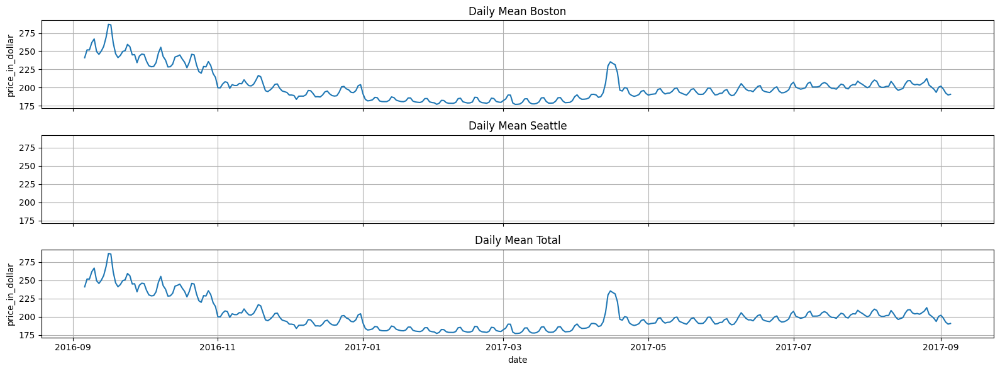

In [759]:
fig, sub = plt.subplots(3,1,figsize=(16,6), sharex=True, sharey=True)
sub = sub.flatten()

sns.lineplot(x = df_calendar_boston_mean.index, y = df_calendar_boston_mean, ax = sub[0])
sns.lineplot(x = df_calendar_seattle_mean.index, y = df_calendar_seattle_mean, ax = sub[1])
sns.lineplot(x = df_calendar_mean.index, y = df_calendar_mean, ax = sub[2])

ls = ["Daily Mean Boston",  "Daily Mean Seattle", "Daily Mean Total"]

for i,s in enumerate(sub.flatten()):
    s.grid()
    s.set_title(ls[i])

fig.tight_layout()

Text(0.5, 1.0, 'Seattle Airbnb Daily Mean Price over weekdays')

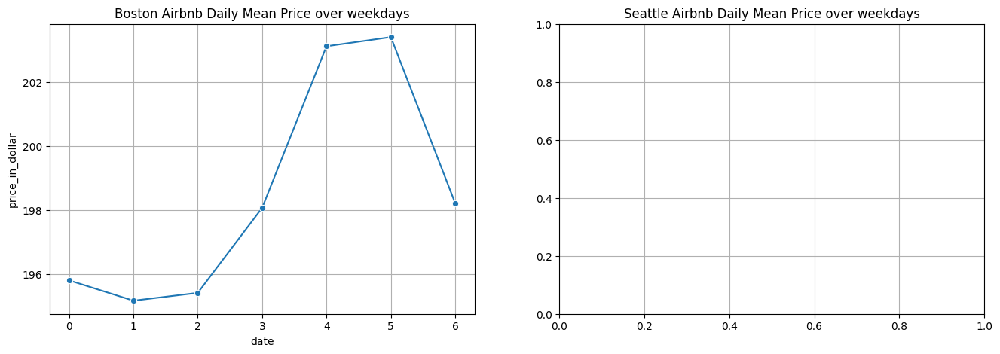

In [760]:
fig, sub = plt.subplots(1,2, figsize=(16,5))

boston_day_of_week = df_calendar_boston.groupby(df_calendar_boston["date"].dt.dayofweek)["price_in_dollar"].mean()
seattle_day_of_week = df_calendar_seattle.groupby(df_calendar_seattle["date"].dt.dayofweek)["price_in_dollar"].mean()

sns.lineplot(x = boston_day_of_week.index, y = boston_day_of_week, ax = sub[0], marker = "o")
sns.lineplot(x = seattle_day_of_week.index, y = seattle_day_of_week, ax = sub[1], marker = "o")

sub[0].grid()
sub[1].grid()

sub[0].set_title("Boston Airbnb Daily Mean Price over weekdays")
sub[1].set_title("Seattle Airbnb Daily Mean Price over weekdays")

### C. Is the distance to the city center a determining factor for the prices?

In [761]:
potential_feats = ["weekday", "host_is_superhost", "host_reponse_rate", "host_response_time", 
"zipcode", "distance_to_city_center", "property_type", "accomodates", "bathrooms", "bedrooms", "beds", "square_feet", "security_deposit", "review_scores_rating"]

In [762]:
df_calendar_dropped.head(3)

,listing_id,date,available,price_in_dollar,city_assignment,price_in_dollar_ff
1207784,3353,2016-09-06,f,NaN,Boston,32.0
1207783,3353,2016-09-07,f,NaN,Boston,32.0
1207782,3353,2016-09-08,f,NaN,Boston,32.0


In [763]:
df_calendar_dropped["weekday"] = df_calendar_dropped["date"].dt.weekday

In [764]:
pd.merge(left = df_calendar_dropped, )

TypeError: merge() missing 1 required positional argument: 'right'

# 6. Conclusion